In [1]:
# adapted from:https://www.analyticsvidhya.com/blog/2019/05/understanding-visualizing-neural-networks/


In [1]:
import matplotlib.pyplot as plt

In [2]:
#importing required modules
from keras.applications import VGG16
from keras.models import load_model

#loading the saved model
#we are using the complete architecture thus include_top=True
#model = VGG16(weights='imagenet',include_top=True)
model = load_model('../../Models/classification/denseNet - model.hd5')
#show the summary of model
model.summary()

Using TensorFlow backend.


KeyboardInterrupt: 

In [56]:
model.optimizer

In [6]:
#creating a mapping of layer name ot layer details 
#we will create a dictionary layers_info which maps a layer name to its charcteristics
layers_info = {}
for i in model.layers:
    layers_info[i.name] = i.get_config()

#here the layer_weights dictionary will map every layer_name to its corresponding weights
layer_weights = {}
for i in model.layers:
    layer_weights[i.name] = i.get_weights()

print(layers_info['conv2_block1_2_conv'])

NameError: name 'model' is not defined

# Visualize Filters

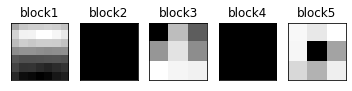

In [10]:
layers = model.layers
layer_ids = [2, 9, 12, 16, 19]
#layer_ids = [1,4,7,11,15]
#plot the filters
fig,ax = plt.subplots(nrows=1,ncols=len(layer_ids))
for i in range(len(layer_ids)):
    ax[i].imshow(layers[layer_ids[i]].get_weights()[0][:,:,:,0][:,:,0],cmap='gray')
    ax[i].set_title('block'+str(i+1))
    ax[i].set_xticks([])
    ax[i].set_yticks([])

# Visualize Activation Maximization

In [37]:
WIDTH = 512
HEIGHT = 512

In [47]:
# we need a fixed input_shape to do "visualize_activation"
#importing the required modules
from vis.visualization import visualize_activation
from vis.utils import utils
from keras import activations
from keras import applications
from keras.models import load_model
from keras.models import Model
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (18,6)


import keras
from keras.applications import VGG16, InceptionV3, DenseNet121, MobileNetV2
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, GlobalMaxPooling2D

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(WIDTH, HEIGHT, 3))
# base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(WIDTH, HEIGHT, 3))
# base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(WIDTH, HEIGHT, 3))
# base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(WIDTH,HEIGHT,3))

CLASSES = 2

x = base_model.output
x = GlobalMaxPooling2D(name='max_pool')(x)#x = GlobalAveragePooling2D(name='avg_pool')(x)
x = Dropout(0.4)(x)
# predictions = Dense(CLASSES, activation='softmax')(x)
predictions = Dense(CLASSES, activation='linear')(x)
new_model = Model(inputs=base_model.input, outputs=predictions)
   
# transfer learning
for layer in base_model.layers:
    layer.trainable = False
      
new_model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

In [48]:
#model = load_model('../../Models/classification/denseNet - model.hd5')
#new_model.set_weights(model.get_weights())

# new_model.load_weights('../../Models/classification/denseNet-37-0.82.hdf5')

# new_model.load_weights('../../Models/classification/experiments/vgg512-09-acc 0.79-loss 2.2535.hdf5')
# new_model.load_weights('../../Models/classification/experiments/inception512-13-acc 0.48-loss 0.0664.hdf5')
# new_model.load_weights('../../Models/classification/experiments/mobilenet512-19-acc 0.75-loss 0.0304.hdf5')
# new_model.load_weights('../../Models/classification/experiments/densenet512-19-acc 0.70-loss 0.2254.hdf5')

new_model.load_weights('../../Models/classification/experiments/vgg768-18-acc 0.81-loss 0.0003.hdf5')
# new_model.load_weights('../../Models/classification/experiments/inception768-19-acc 0.64-loss 1.5210.hdf5')
# new_model.load_weights('../../Models/classification/experiments/mobilenet768-14-acc 0.69-loss 1.2320.hdf5')
# new_model.load_weights('../../Models/classification/experiments/densenet768-09-acc 0.72-loss 2.2033.hdf5')


# new_model.load_weights('../../Models/classification/denseNet-37-0.82.hdf5')

In [33]:

# Utility to search for layer index by name. 
# Alternatively we can specify this as -1 since it corresponds to the last layer.
layer_idx = -1 #utils.find_layer_idx(new_model, 'dense_3')

# Swap softmax with linear
new_model.layers[layer_idx].activation = activations.linear
new_model = utils.apply_modifications(new_model)

KeyboardInterrupt: 

In [19]:
# 20 is the imagenet category for 'ouzel'

img0 = visualize_activation(new_model, layer_idx, filter_indices=0, max_iter = 500, verbose=True)
plt.imshow(img0)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



InvalidArgumentError: input_1_1:0 is both fed and fetched.

Iteration: 1, named_losses: <zip object at 0x19ea6b640>, overall loss: 6501.017578125
Iteration: 2, named_losses: <zip object at 0x1dfb2c4b0>, overall loss: 3245.167236328125
Iteration: 3, named_losses: <zip object at 0x1dfb0c410>, overall loss: 1775.2166748046875
Iteration: 4, named_losses: <zip object at 0x1dfb0cc80>, overall loss: 983.7833862304688
Iteration: 5, named_losses: <zip object at 0x1dfb02a50>, overall loss: 549.25439453125
Iteration: 6, named_losses: <zip object at 0x1dfb02500>, overall loss: 324.5835876464844
Iteration: 7, named_losses: <zip object at 0x1dfafa9b0>, overall loss: 218.26263427734375
Iteration: 8, named_losses: <zip object at 0x1dfb0c820>, overall loss: 153.99192810058594
Iteration: 9, named_losses: <zip object at 0x1dfaf3fa0>, overall loss: 124.96798706054688
Iteration: 10, named_losses: <zip object at 0x1dfb02eb0>, overall loss: 75.03475189208984
Iteration: 11, named_losses: <zip object at 0x1dfaea960>, overall loss: 60.45665740966797
Iteration: 12, named

Iteration: 92, named_losses: <zip object at 0x1dfadbc80>, overall loss: -159.17730712890625
Iteration: 93, named_losses: <zip object at 0x1dfadbeb0>, overall loss: -105.64341735839844
Iteration: 94, named_losses: <zip object at 0x1dfac7960>, overall loss: -166.65145874023438
Iteration: 95, named_losses: <zip object at 0x1dfaea960>, overall loss: -146.0986785888672
Iteration: 96, named_losses: <zip object at 0x19eabd2d0>, overall loss: -152.01998901367188
Iteration: 97, named_losses: <zip object at 0x1dfafae60>, overall loss: -160.2054443359375
Iteration: 98, named_losses: <zip object at 0x1dfad0e60>, overall loss: -148.69876098632812
Iteration: 99, named_losses: <zip object at 0x1dfadb780>, overall loss: -139.4163818359375
Iteration: 100, named_losses: <zip object at 0x1dfadb280>, overall loss: -147.28955078125
Iteration: 101, named_losses: <zip object at 0x1dfafae60>, overall loss: -161.54690551757812
Iteration: 102, named_losses: <zip object at 0x1dfac7dc0>, overall loss: -146.729400

Iteration: 181, named_losses: <zip object at 0x19eabd2d0>, overall loss: -189.01205444335938
Iteration: 182, named_losses: <zip object at 0x1dfad0e60>, overall loss: -191.87686157226562
Iteration: 183, named_losses: <zip object at 0x1dfac7dc0>, overall loss: -181.82630920410156
Iteration: 184, named_losses: <zip object at 0x1dfac74b0>, overall loss: -204.7766571044922
Iteration: 185, named_losses: <zip object at 0x1d59067d0>, overall loss: -182.8976593017578
Iteration: 186, named_losses: <zip object at 0x1dfadbb40>, overall loss: -204.36032104492188
Iteration: 187, named_losses: <zip object at 0x1dfad0dc0>, overall loss: -187.95260620117188
Iteration: 188, named_losses: <zip object at 0x1d59067d0>, overall loss: -209.66014099121094
Iteration: 189, named_losses: <zip object at 0x1dfadbb40>, overall loss: -165.2991485595703
Iteration: 190, named_losses: <zip object at 0x1dfad0e60>, overall loss: -214.33079528808594
Iteration: 191, named_losses: <zip object at 0x1dfac74b0>, overall loss: 

Iteration: 270, named_losses: <zip object at 0x1dfadb780>, overall loss: -228.97471618652344
Iteration: 271, named_losses: <zip object at 0x1dfae1870>, overall loss: -248.32684326171875
Iteration: 272, named_losses: <zip object at 0x1dfadb280>, overall loss: -234.88865661621094
Iteration: 273, named_losses: <zip object at 0x1dfad0a00>, overall loss: -245.1529998779297
Iteration: 274, named_losses: <zip object at 0x1dfac7cd0>, overall loss: -215.5253448486328
Iteration: 275, named_losses: <zip object at 0x1dfaea960>, overall loss: -239.49588012695312
Iteration: 276, named_losses: <zip object at 0x1dfadbb40>, overall loss: -222.2545166015625
Iteration: 277, named_losses: <zip object at 0x1dfadbfa0>, overall loss: -229.81163024902344
Iteration: 278, named_losses: <zip object at 0x1dfad00f0>, overall loss: -223.07276916503906
Iteration: 279, named_losses: <zip object at 0x1d59067d0>, overall loss: -244.047607421875
Iteration: 280, named_losses: <zip object at 0x1dfac7dc0>, overall loss: -2

Iteration: 360, named_losses: <zip object at 0x1dfadbb40>, overall loss: -333.8517761230469
Iteration: 361, named_losses: <zip object at 0x1dfadbeb0>, overall loss: -240.41079711914062
Iteration: 362, named_losses: <zip object at 0x19eabd2d0>, overall loss: -314.3315124511719
Iteration: 363, named_losses: <zip object at 0x1dfaea960>, overall loss: -271.49609375
Iteration: 364, named_losses: <zip object at 0x1dfad0a00>, overall loss: -295.95770263671875
Iteration: 365, named_losses: <zip object at 0x1dfac7e60>, overall loss: -281.7568359375
Iteration: 366, named_losses: <zip object at 0x19eabd2d0>, overall loss: -313.65826416015625
Iteration: 367, named_losses: <zip object at 0x1dfad0550>, overall loss: -279.5180358886719
Iteration: 368, named_losses: <zip object at 0x1dfac74b0>, overall loss: -314.6968688964844
Iteration: 369, named_losses: <zip object at 0x1dfac7e60>, overall loss: -296.1037292480469
Iteration: 370, named_losses: <zip object at 0x19eabd2d0>, overall loss: -327.5329589

Iteration: 450, named_losses: <zip object at 0x1dfadb280>, overall loss: -283.29248046875
Iteration: 451, named_losses: <zip object at 0x1dfadb780>, overall loss: -366.3861389160156
Iteration: 452, named_losses: <zip object at 0x1dfad0550>, overall loss: -297.11920166015625
Iteration: 453, named_losses: <zip object at 0x1dfac7cd0>, overall loss: -382.521728515625
Iteration: 454, named_losses: <zip object at 0x1dfad06e0>, overall loss: -325.747314453125
Iteration: 455, named_losses: <zip object at 0x1dfadbb40>, overall loss: -388.2159423828125
Iteration: 456, named_losses: <zip object at 0x1dfadb280>, overall loss: -308.43817138671875
Iteration: 457, named_losses: <zip object at 0x1dfad0dc0>, overall loss: -367.10986328125
Iteration: 458, named_losses: <zip object at 0x1dfafae60>, overall loss: -332.330078125
Iteration: 459, named_losses: <zip object at 0x19eabd2d0>, overall loss: -364.89837646484375
Iteration: 460, named_losses: <zip object at 0x1dfae1780>, overall loss: -311.722747802

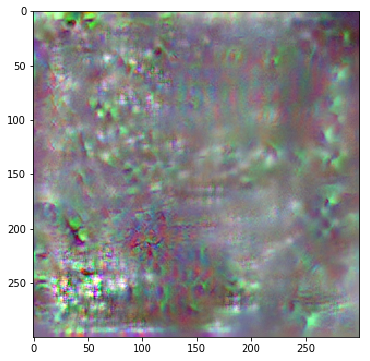

In [9]:
# 20 is the imagenet category for 'ouzel'

img1 = visualize_activation(new_model, layer_idx, filter_indices=1, max_iter = 500, verbose=True)
plt.imshow(img1)

# Visualize important input regions

In [20]:
# https://github.com/raghakot/keras-vis/blob/master/examples/vggnet/attention.ipynb

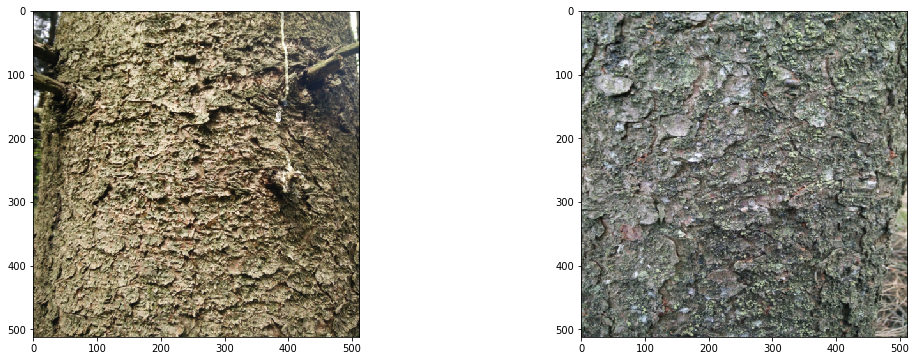

In [7]:
from vis.utils import utils
from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (18, 6)

img1 = utils.load_img('../../Data/Borkenkaefer/data/test/ohne/IMG_20190511_133042.jpg', target_size=(WIDTH, HEIGHT))
#img2 = utils.load_img('../../Data/Borkenkaefer/images/mit/IMG_20190511_133357.jpg', target_size=(WIDTH, HEIGHT))
img2 = utils.load_img('../../Data/Borkenkaefer/data/test/mit/IMG_20190511_133405.jpg', target_size=(WIDTH, HEIGHT))

f, ax = plt.subplots(1, 2)
ax[0].imshow(img1)
ax[1].imshow(img2)

## Saliency

KeyboardInterrupt: 

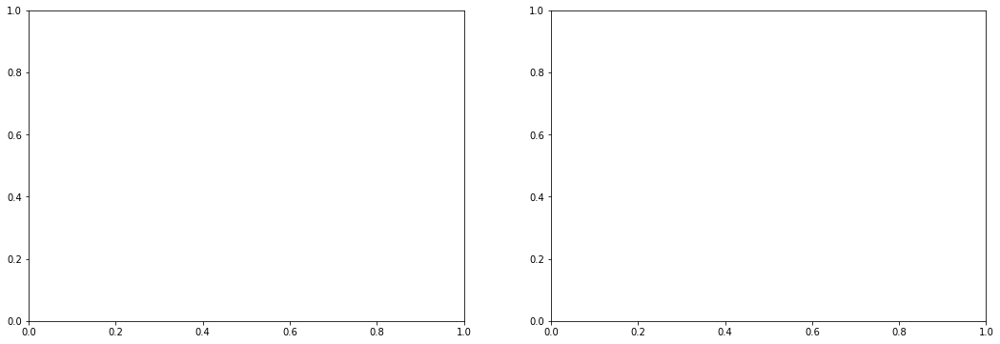

In [17]:
from vis.visualization import visualize_saliency, overlay
from vis.utils import utils
from keras import activations

# Utility to search for layer index by name. 
# Alternatively we can specify this as -1 since it corresponds to the last layer.
layer_idx = -1 #utils.find_layer_idx(model, 'dense_3')

f, ax = plt.subplots(1, 2)
for i, img in enumerate([img1, img2]):
    # 20 is the imagenet index corresponding to `ouzel`
    grads = visualize_saliency(new_model, layer_idx, filter_indices=0, seed_input=img)#, backprop_modifier=None)#'guided')#, verbose=True)
    
    # visualize grads as heatmap
    ax[i].imshow(grads, cmap='jet')

## grad-CAM

In [ ]:
#model = VGG16(weights='imagenet',include_top=True)

In [8]:
new_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 512, 512, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 512, 512, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 512, 512, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 256, 256, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 256, 256, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 256, 256, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 128, 128, 128)     0   

### 768

<Figure size 1296x432 with 0 Axes>

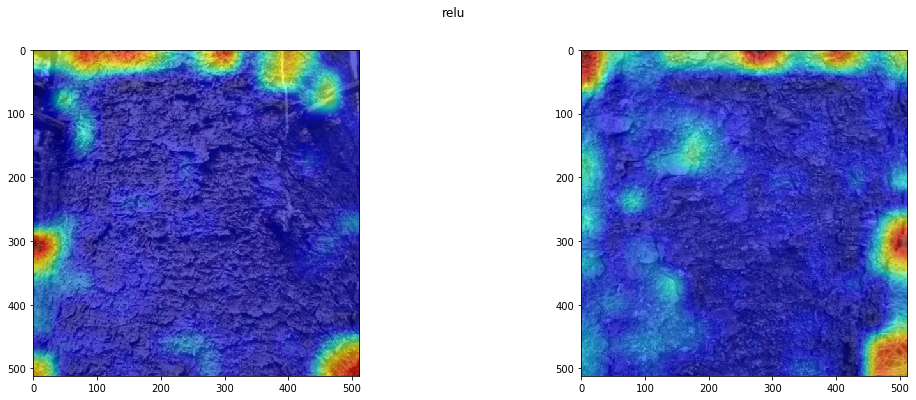

<Figure size 1296x432 with 0 Axes>

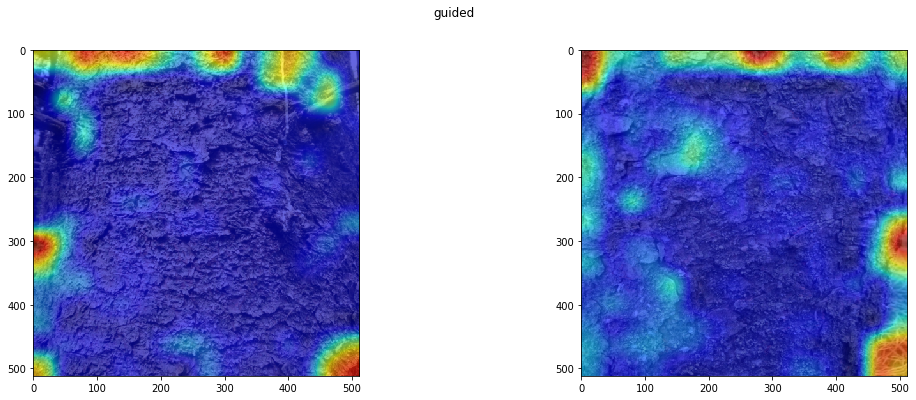

<Figure size 1296x432 with 0 Axes>

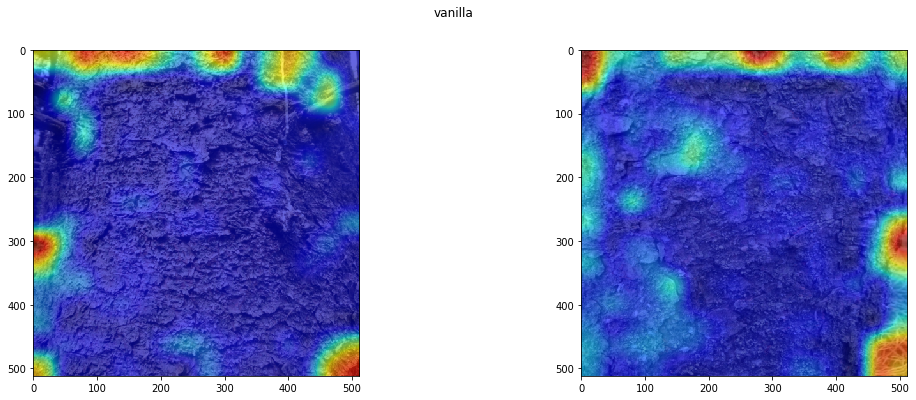

In [49]:
#vgg16
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

<Figure size 1296x432 with 0 Axes>

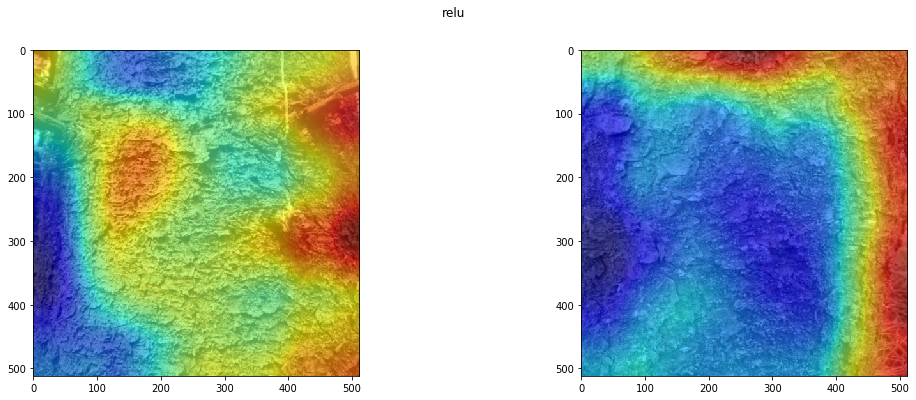

<Figure size 1296x432 with 0 Axes>

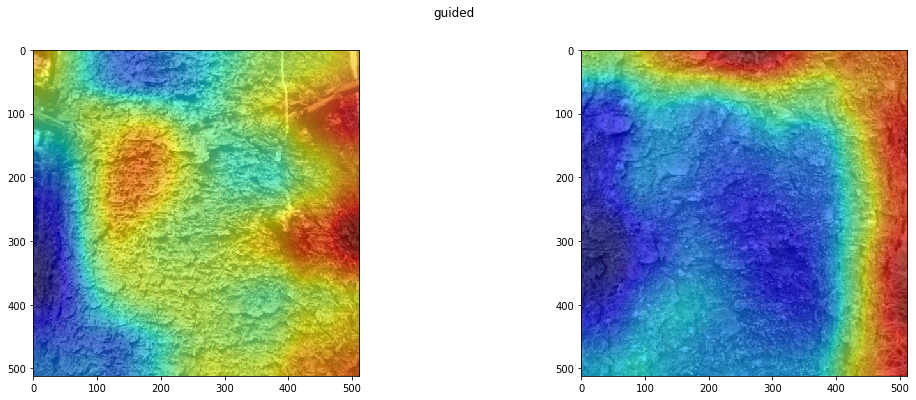

<Figure size 1296x432 with 0 Axes>

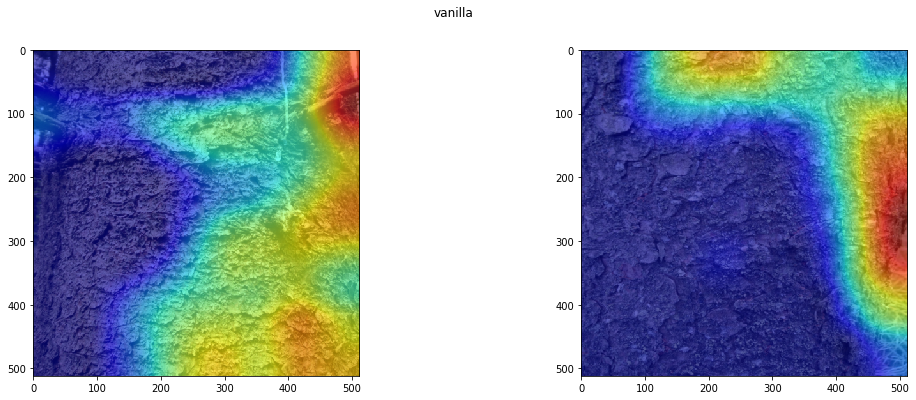

In [46]:
#inceptionV3
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

<Figure size 1296x432 with 0 Axes>

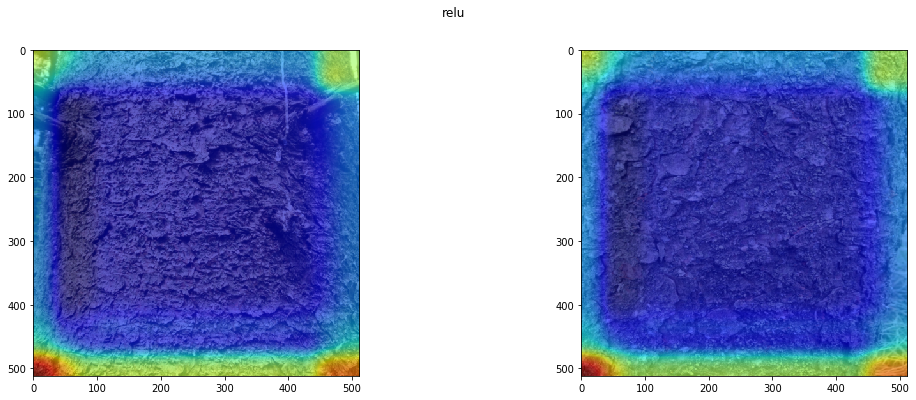

<Figure size 1296x432 with 0 Axes>

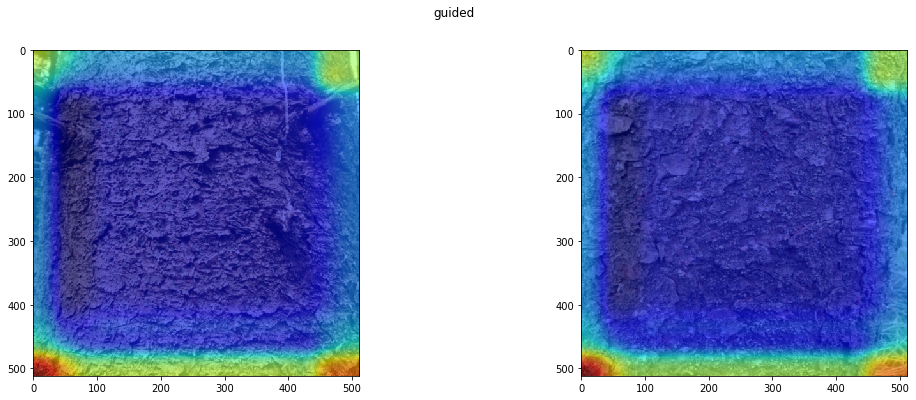

<Figure size 1296x432 with 0 Axes>

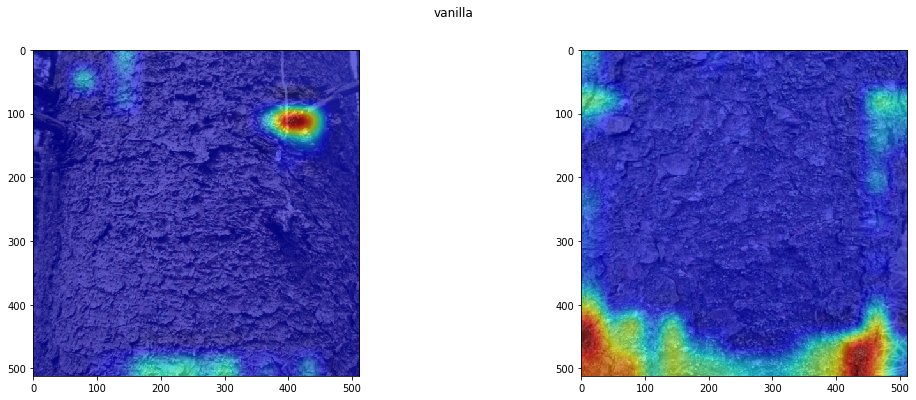

In [43]:
#mobilenetv2
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

<Figure size 1296x432 with 0 Axes>

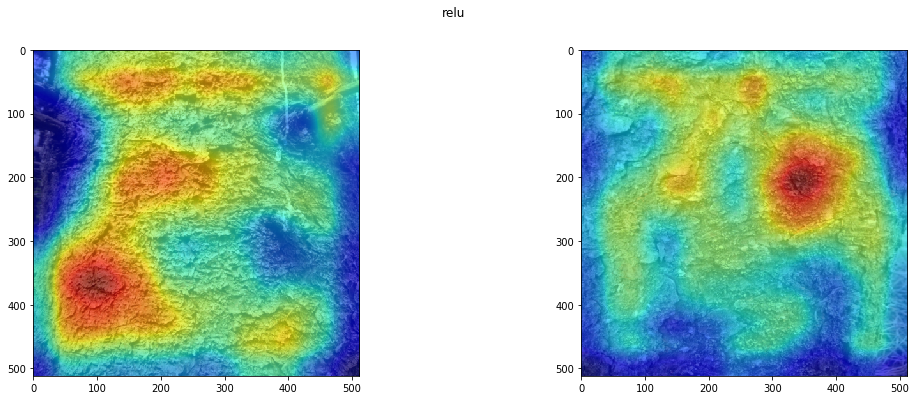

<Figure size 1296x432 with 0 Axes>

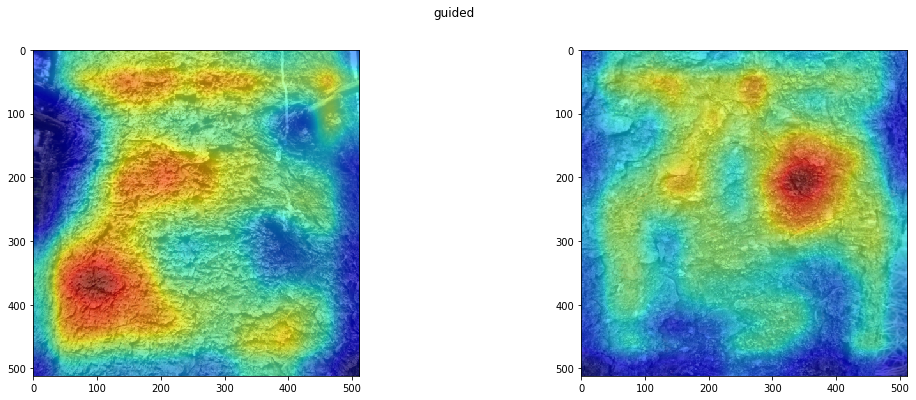

<Figure size 1296x432 with 0 Axes>

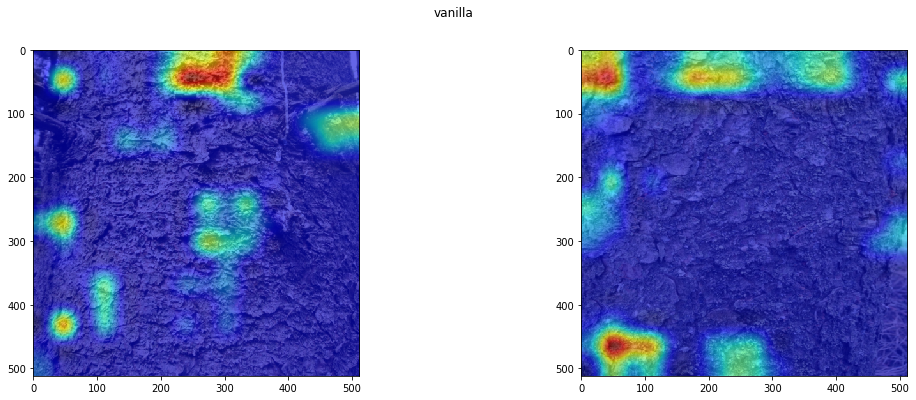

In [40]:
#densenet121
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

### 512

<Figure size 1296x432 with 0 Axes>

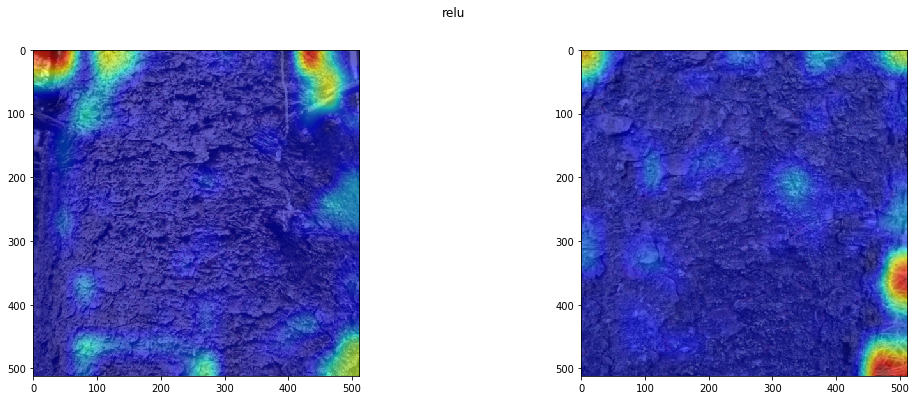

<Figure size 1296x432 with 0 Axes>

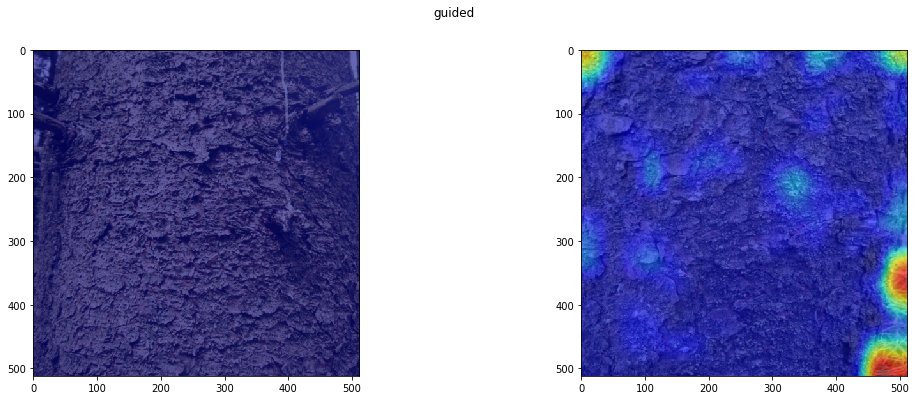

<Figure size 1296x432 with 0 Axes>

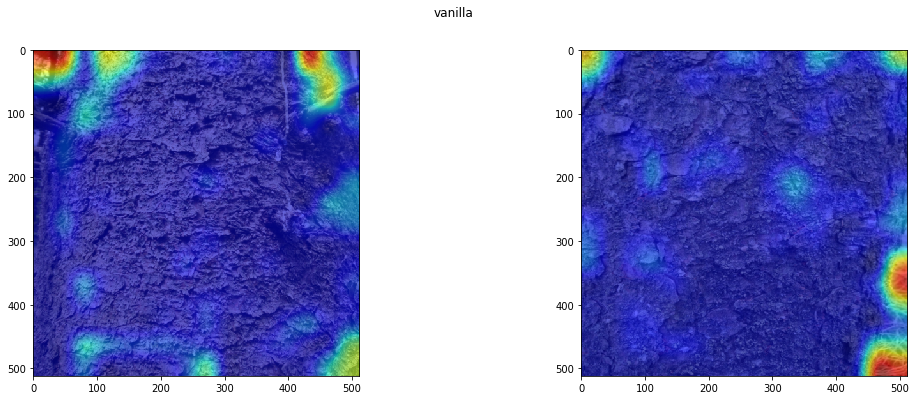

In [9]:
#vgg16
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

<Figure size 1296x432 with 0 Axes>

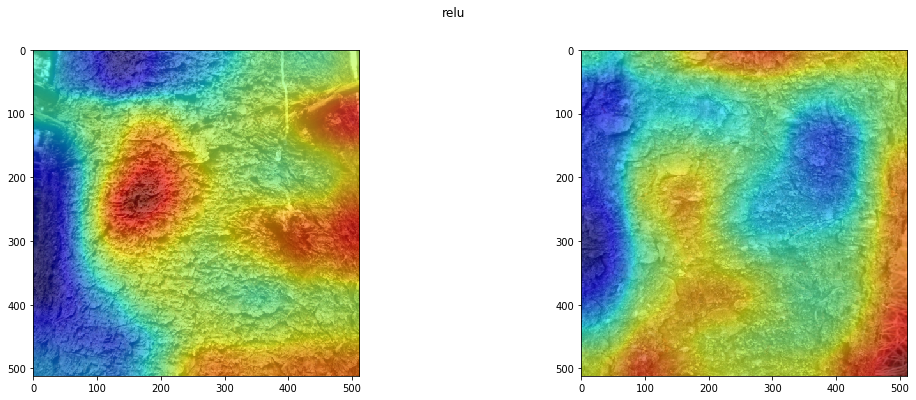

<Figure size 1296x432 with 0 Axes>

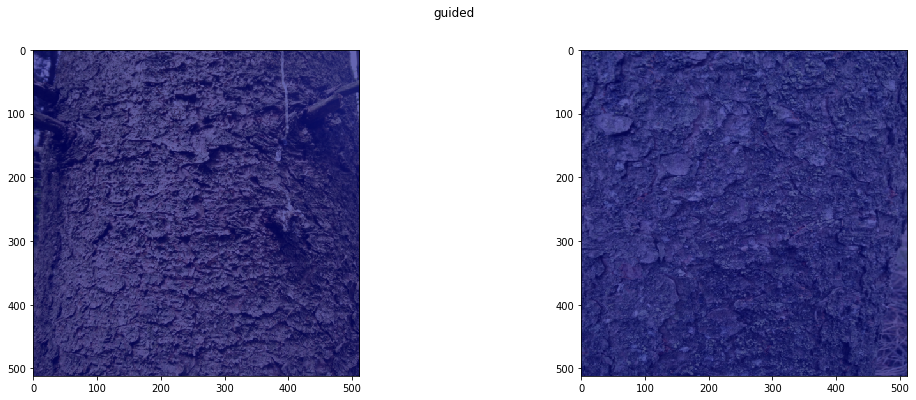

<Figure size 1296x432 with 0 Axes>

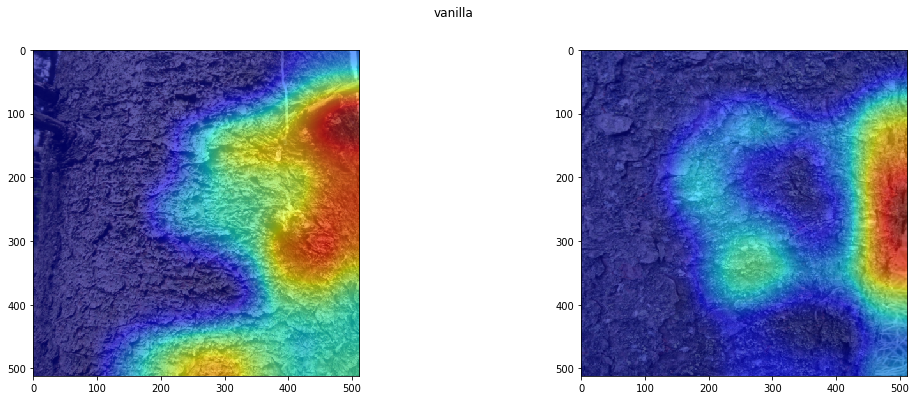

In [19]:
#inceptionV3
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

<Figure size 1296x432 with 0 Axes>

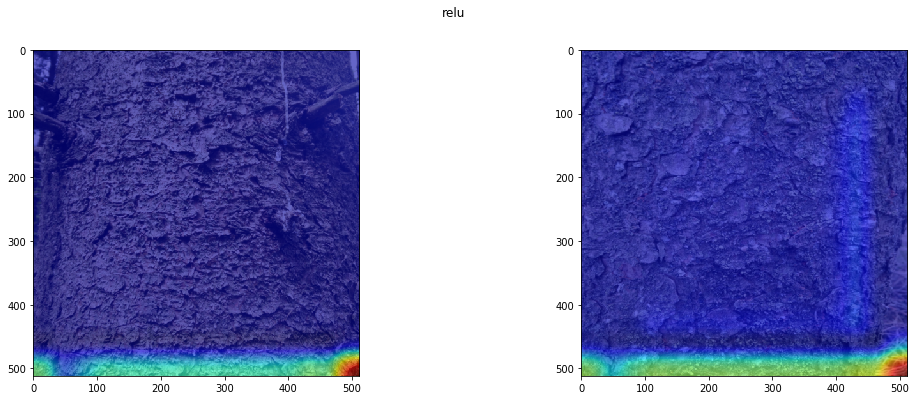

<Figure size 1296x432 with 0 Axes>

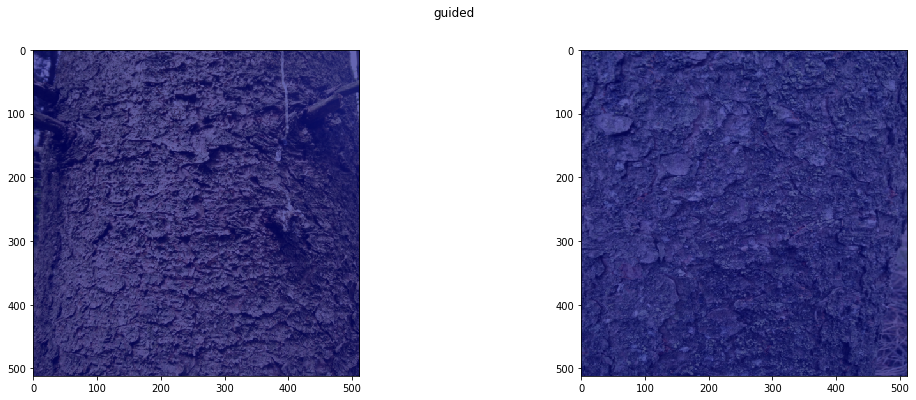

<Figure size 1296x432 with 0 Axes>

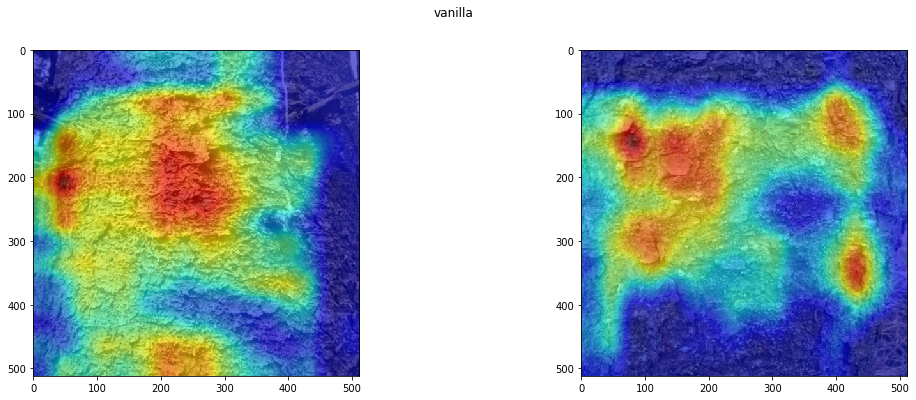

In [23]:
#mobilenetv2
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

<Figure size 1296x432 with 0 Axes>

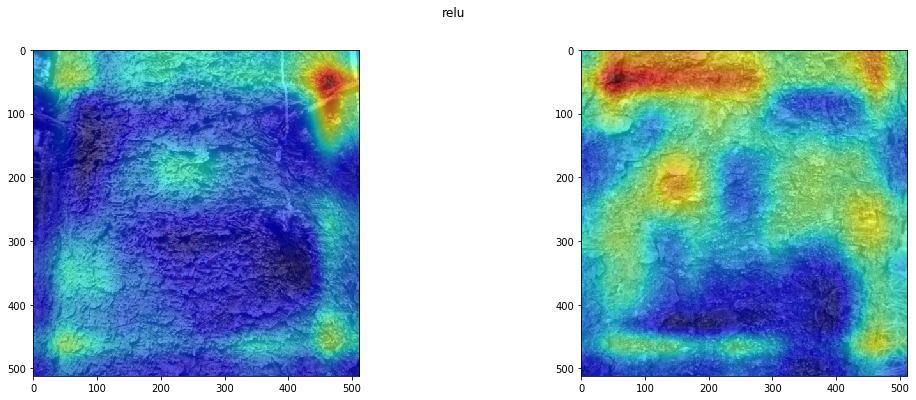

<Figure size 1296x432 with 0 Axes>

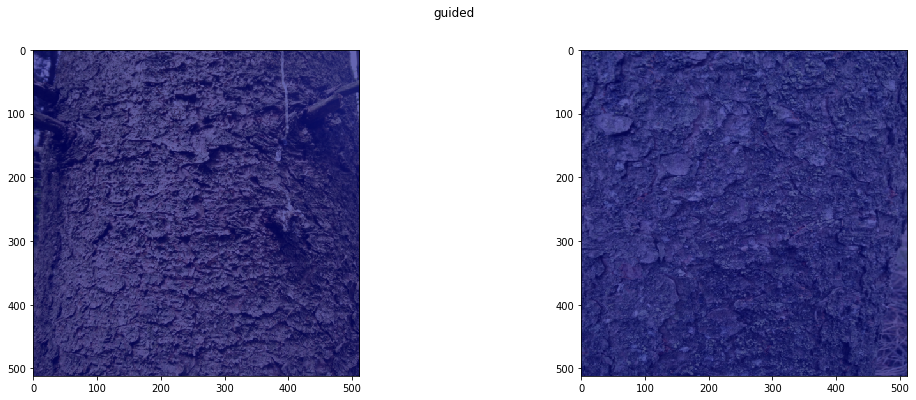

<Figure size 1296x432 with 0 Axes>

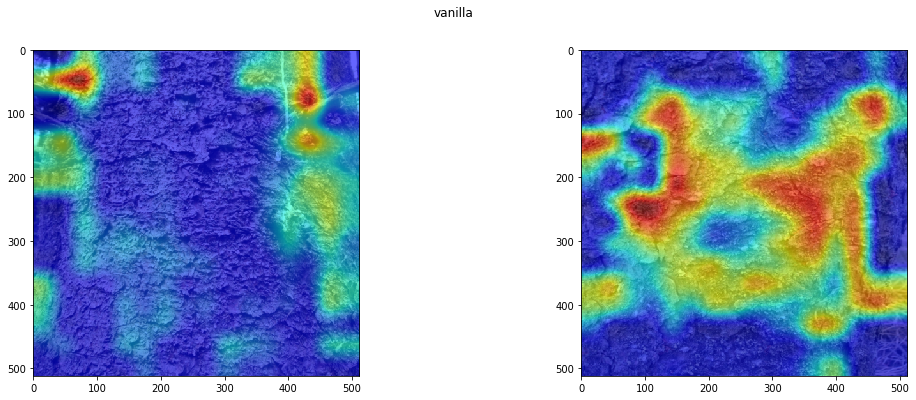

In [28]:
#densenet121
# pip3 install tensorflow==1.15.0rc3
# or: change "tf.get_default_graph()" to "tf.compat.v1.get_default_graph()" in "C:\Users\Gini\Anaconda3\envs\masterarbeit 2\Lib\site-packages\vis\backend\tensorflow_backend.py"
import numpy as np
import matplotlib.cm as cm
from vis.visualization import visualize_cam

for modifier in ['relu', 'guided', None]:
    plt.figure()
    f, ax = plt.subplots(1, 2)
    plt.suptitle("vanilla" if modifier is None else modifier)
    for i, img in enumerate([img1, img2]):    
        grads = visualize_cam(new_model, layer_idx, filter_indices=0, 
                              seed_input=img, backprop_modifier=modifier)   
        
        # Lets overlay the heatmap onto original image.    
        #jet_heatmap = np.uint8(cm.jet(grads) * 255)
        
        #ax[i].imshow(overlay(jet_heatmap, img))
        ax[i].imshow(img)    

        # add gradient as overlay
        ax[i].imshow(grads,cmap='jet', alpha = 0.6)

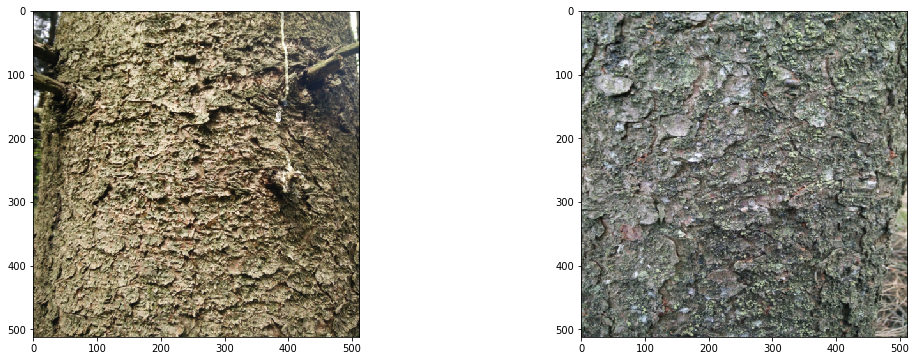

In [16]:
f, ax = plt.subplots(1, 2)
ax[0].imshow(img1)
ax[1].imshow(img2)

# occlusion maps

In [ ]:
# https://www.analyticsvidhya.com/blog/2019/05/understanding-visualizing-neural-networks/

In [ ]:
import numpy as np

from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Activation, Conv2D, MaxPooling2D
from keras.optimizers import Adam

from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.activations import relu

%matplotlib inline
import matplotlib.pyplot as plt
def iter_occlusion(image, size=8):

    occlusion = np.full((size * 5, size * 5, 1), [0.5], np.float32)
    occlusion_center = np.full((size, size, 1), [0.5], np.float32)
    occlusion_padding = size * 2

    # print('padding...')
    image_padded = np.pad(image, ( \
                        (occlusion_padding, occlusion_padding), (occlusion_padding, occlusion_padding), (0, 0) \
                        ), 'constant', constant_values = 0.0)

    for y in range(occlusion_padding, image.shape[0] + occlusion_padding, size):

        for x in range(occlusion_padding, image.shape[1] + occlusion_padding, size):
            tmp = image_padded.copy()

            tmp[y - occlusion_padding:y + occlusion_center.shape[0] + occlusion_padding, \
                x - occlusion_padding:x + occlusion_center.shape[1] + occlusion_padding] \
                = occlusion

            tmp[y:y + occlusion_center.shape[0], x:x + occlusion_center.shape[1]] = occlusion_center

            yield x - occlusion_padding, y - occlusion_padding, \
                  tmp[occlusion_padding:tmp.shape[0] - occlusion_padding, occlusion_padding:tmp.shape[1] - occlusion_padding]

In [ ]:
WIDTH = 500
HEIGHT = 500
file_name = '../../Data/Borkenkaefer/data/train/ohne/IMG_20190511_133007.jpg'

In [ ]:
from keras.preprocessing.image import load_img

# load an image from file
image = load_img(file_name, target_size=(WIDTH, HEIGHT))
plt.imshow(image)
plt.title('ORIGINAL IMAGE')

In [62]:
model = load_model('../../Models/transferedGlobalMaxPool.h5')

(500, 500, 3)
0 0 0  -  (500, 500, 3)
20 0 1  -  (500, 500, 3)
40 0 2  -  (500, 500, 3)
60 0 3  -  (500, 500, 3)
80 0 4  -  (500, 500, 3)
100 0 5  -  (500, 500, 3)
120 0 6  -  (500, 500, 3)
140 0 7  -  (500, 500, 3)
160 0 8  -  (500, 500, 3)
180 0 9  -  (500, 500, 3)
200 0 10  -  (500, 500, 3)
220 0 11  -  (500, 500, 3)
240 0 12  -  (500, 500, 3)
260 0 13  -  (500, 500, 3)
280 0 14  -  (500, 500, 3)
300 0 15  -  (500, 500, 3)
320 0 16  -  (500, 500, 3)
340 0 17  -  (500, 500, 3)
360 0 18  -  (500, 500, 3)
380 0 19  -  (500, 500, 3)
400 0 20  -  (500, 500, 3)
420 0 21  -  (500, 500, 3)
440 0 22  -  (500, 500, 3)
460 0 23  -  (500, 500, 3)
480 0 24  -  (500, 500, 3)
0 20 25  -  (500, 500, 3)
20 20 26  -  (500, 500, 3)
40 20 27  -  (500, 500, 3)
60 20 28  -  (500, 500, 3)
80 20 29  -  (500, 500, 3)
100 20 30  -  (500, 500, 3)
120 20 31  -  (500, 500, 3)
140 20 32  -  (500, 500, 3)
160 20 33  -  (500, 500, 3)
180 20 34  -  (500, 500, 3)
200 20 35  -  (500, 500, 3)
220 20 36  -  (500, 500, 

180 220 284  -  (500, 500, 3)
200 220 285  -  (500, 500, 3)
220 220 286  -  (500, 500, 3)
240 220 287  -  (500, 500, 3)
260 220 288  -  (500, 500, 3)
280 220 289  -  (500, 500, 3)
300 220 290  -  (500, 500, 3)
320 220 291  -  (500, 500, 3)
340 220 292  -  (500, 500, 3)
360 220 293  -  (500, 500, 3)
380 220 294  -  (500, 500, 3)
400 220 295  -  (500, 500, 3)
420 220 296  -  (500, 500, 3)
440 220 297  -  (500, 500, 3)
460 220 298  -  (500, 500, 3)
480 220 299  -  (500, 500, 3)
0 240 300  -  (500, 500, 3)
20 240 301  -  (500, 500, 3)
40 240 302  -  (500, 500, 3)
60 240 303  -  (500, 500, 3)
80 240 304  -  (500, 500, 3)
100 240 305  -  (500, 500, 3)
120 240 306  -  (500, 500, 3)
140 240 307  -  (500, 500, 3)
160 240 308  -  (500, 500, 3)
180 240 309  -  (500, 500, 3)
200 240 310  -  (500, 500, 3)
220 240 311  -  (500, 500, 3)
240 240 312  -  (500, 500, 3)
260 240 313  -  (500, 500, 3)
280 240 314  -  (500, 500, 3)
300 240 315  -  (500, 500, 3)
320 240 316  -  (500, 500, 3)
340 240 317  -  

200 440 560  -  (500, 500, 3)
220 440 561  -  (500, 500, 3)
240 440 562  -  (500, 500, 3)
260 440 563  -  (500, 500, 3)
280 440 564  -  (500, 500, 3)
300 440 565  -  (500, 500, 3)
320 440 566  -  (500, 500, 3)
340 440 567  -  (500, 500, 3)
360 440 568  -  (500, 500, 3)
380 440 569  -  (500, 500, 3)
400 440 570  -  (500, 500, 3)
420 440 571  -  (500, 500, 3)
440 440 572  -  (500, 500, 3)
460 440 573  -  (500, 500, 3)
480 440 574  -  (500, 500, 3)
0 460 575  -  (500, 500, 3)
20 460 576  -  (500, 500, 3)
40 460 577  -  (500, 500, 3)
60 460 578  -  (500, 500, 3)
80 460 579  -  (500, 500, 3)
100 460 580  -  (500, 500, 3)
120 460 581  -  (500, 500, 3)
140 460 582  -  (500, 500, 3)
160 460 583  -  (500, 500, 3)
180 460 584  -  (500, 500, 3)
200 460 585  -  (500, 500, 3)
220 460 586  -  (500, 500, 3)
240 460 587  -  (500, 500, 3)
260 460 588  -  (500, 500, 3)
280 460 589  -  (500, 500, 3)
300 460 590  -  (500, 500, 3)
320 460 591  -  (500, 500, 3)
340 460 592  -  (500, 500, 3)
360 460 593  -  

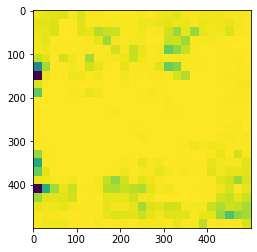

In [63]:
from keras.preprocessing.image import img_to_array
from keras.applications.inception_v3 import preprocess_input
# convert the image pixels to a numpy array
image = img_to_array(image)
# reshape data for the model
image = np.expand_dims(image, axis=0)#image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# prepare the image for the VGG model
image = preprocess_input(image)
# predict the probability across all output classes
yhat = model.predict(image)
temp = image[0]
print(temp.shape)
heatmap = np.zeros((WIDTH,HEIGHT))
correct_class = np.argmax(yhat)
for n,(x,y,image) in enumerate(iter_occlusion(temp,20)):
    heatmap[x:x+20,y:y+20] = model.predict(image.reshape((1, image.shape[0], image.shape[1], image.shape[2])))[0][correct_class]
    print(x,y,n,' - ',image.shape)
heatmap1 = heatmap/heatmap.max()
plt.imshow(heatmap)

C:\Users\Gini\Anaconda3\envs\masterarbeit 2\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


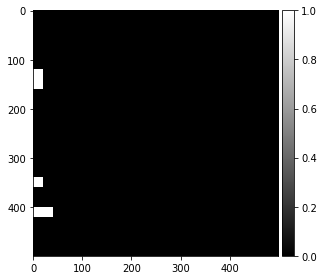

In [69]:
import skimage.io as io
#creating mask from the standardised heatmap probabilities
mask = heatmap1 < 0.999
mask1 = mask *256
mask = mask.astype(int)
io.imshow(mask,cmap='gray')

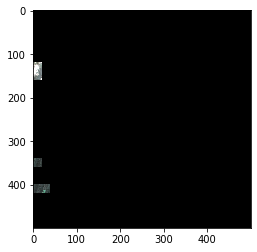

In [70]:
import cv2
#read the image
image = cv2.imread(file_name)
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
#resize image to appropriate dimensions
image = cv2.resize(image,(WIDTH,HEIGHT))
mask = mask.astype('uint8')
#apply the mask to the image
final = cv2.bitwise_and(image,image,mask = mask)
final = cv2.cvtColor(final,cv2.COLOR_BGR2RGB)
#plot the final image
plt.imshow(final)